# Plenoptic function


Using copilot to help me to generate the codes

* https://www.cs.princeton.edu/courses/archive/spr01/cs598b/papers/mcmillan95.pdf

* http://luthuli.cs.uiuc.edu/~daf/courses/CV23/Slides/lec21_plenoptic-daf.pdf

## Plenoptic Modeling: An Image-Based Rendering System

A Copilot study

This paper introduces Image-Based Rendering (IBR) as an alternative to traditional 3D graphics. Instead of explicitly modeling geometry (polygons, meshes), it:

✅ Uses real images as the primary representation of a scene </br>
✅ Builds new views by sampling and reconstructing the “plenoptic function”

### Key concept


The central theoretical contribution is the plenoptic function, defined as:

```
A function that describes everything visible from any viewpoint in space, direction, time, and wavelength. [cs.princeton.edu]
```

Parameters:

Position: (Vx,Vy,Vz)(Vx, Vy, Vz)(Vx,Vy,Vz) </br>
Viewing direction: (θ,φ)(θ, φ)(θ,φ) </br>
Time: *t* </br>
Wavelength: λλλ </br>

👉 In simple terms:
Think of it as a giant function that answers:

```
“What color do I see if I look in a certain direction from a certain point?”
```

### Problem Formulation

```
“Given discrete samples of the plenoptic function, reconstruct a continuous version of it.”
```

This leads to 3 main tasks:

* Sampling – capture images from different viewpoints
* Reconstruction – estimate missing views
* Resampling – generate new views for the user

###  How Image-Based Rendering Differs from Traditional Graphics

<table>
    <tr>
        <th><b>Traditional Rendering</b></th>
        <th><b>Image-Based Rendering</b></th>
    </tr>
    <tr>
        <th>Uses explicit geometry (meshes)</th>
        <th>Uses collections of images</th>
    </tr>
    <tr>
        <th>Needs accurate 3D modeling</th>
        <th>Works directly from captured data</th>
    </tr>
    <tr>
        <th>Expensive to model real scenes</th>
        <th>Easier for complex real-world scenes</th>
    </tr>
</table>


* Real-world geometry is extremely complex to model precisely [cs.princeton.edu]
* IBR bypasses that by working directly with images

### Key Technical Contributions

1. New Visibility Algorithm
* Determines which surfaces are visible when synthesizing views
* Important because images don’t explicitly store depth

2. Cylindrical Epipolar Constraint
* Extends geometry constraints (like epipolar lines)
* Works for cylindrical projections instead of planar ones

3. Unified Framework
* Provides a theoretical foundation for IBR
* Lets us compare different rendering methods under one model

## Libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2

## 4.1 Plenoptic Sample Representation

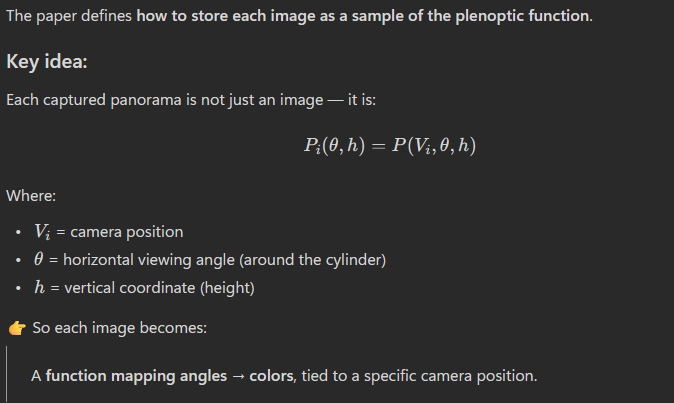

In [2]:
# Step 1: Represent one plenoptic sample
class PlenopticSample:
    def __init__(self, position, image):
        """
        position: (x, y, z) camera location
        image: numpy array (H, W, 3) cylindrical panorama
        """
        self.position = np.array(position)
        self.image = image
        self.height, self.width = image.shape[:2]

    def sample_ray(self, theta, h):
        """
        Query the plenoptic sample for a ray:
        theta: horizontal angle (-π to π)
        h: vertical position (0 to 1 normalized)
        """
        # Convert theta → image x coordinate
        x = int((theta + np.pi) / (2 * np.pi) * self.width)
        
        # Convert normalized height → pixel y coordinate
        y = int(h * self.height)

        # Clamp to valid indices
        x = np.clip(x, 0, self.width - 1)
        y = np.clip(y, 0, self.height - 1)

        return self.image[y, x]

sample_ray(theta, h) is essentially computing:

P(Vi​,θ,h)

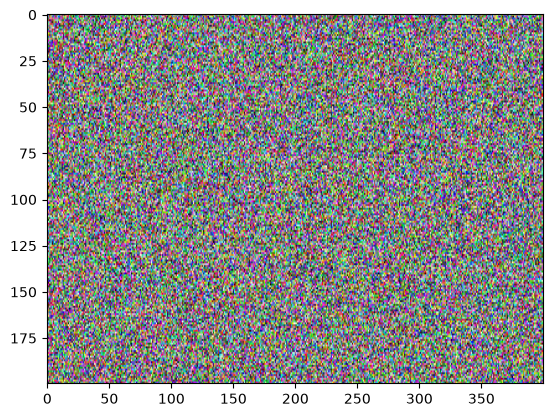

In [3]:
# Step 2: Create a sample
# Fake image (just random colors for demo)
image = np.random.randint(0, 255, (200, 400, 3), dtype=np.uint8)

sample = PlenopticSample(
    position=(0, 0, 0),
    image=image
)

plt.imshow(sample.image, cmap='gray', aspect='auto')
plt.show()


In [4]:
# Step 3: Query a ray
# Look slightly to the right, middle height
theta = 0.5   # radians
h = 0.5       # vertical midpoint

color = sample.sample_ray(theta, h)
print("Sampled color:", color)

Sampled color: [110  83 148]


In [5]:
# Step 4: Multiple samples (scene representation)

samples = [
    PlenopticSample((0, 0, 0), image),
    PlenopticSample((1, 0, 0), image),
    PlenopticSample((0, 1, 0), image),
]

# for sample in samples:
#     plt.imshow(sample.image, cmap='gray', aspect='auto')
#     plt.show()


### Using PNG images

#### Step 1: Load PNG images

Already imported in Libraries section
```
from PIL import Image 
```

#### Step 2: Define the Plenoptic Sample class

In [6]:
class PlenopticSample:
    def __init__(self, position, image_path):
        """
        position: (x, y, z) camera location
        image_path: path to PNG panorama
        """
        self.position = np.array(position)

        # Load PNG image
        img = Image.open(image_path).convert("RGB")
        self.image = np.array(img)

        self.height, self.width = self.image.shape[:2]

    def sample_ray(self, theta, h):
        """
        theta: horizontal angle (-π to π)
        h: vertical coordinate (0 to 1)
        """
        # Convert angle → horizontal pixel
        x = int((theta + np.pi) / (2 * np.pi) * self.width)

        # Convert vertical position → pixel
        y = int(h * self.height)

        # Clamp indices
        x = np.clip(x, 0, self.width - 1)
        y = np.clip(y, 0, self.height - 1)

        return self.image[y, x]

#### Step 3: Create samples from PNG panoramas

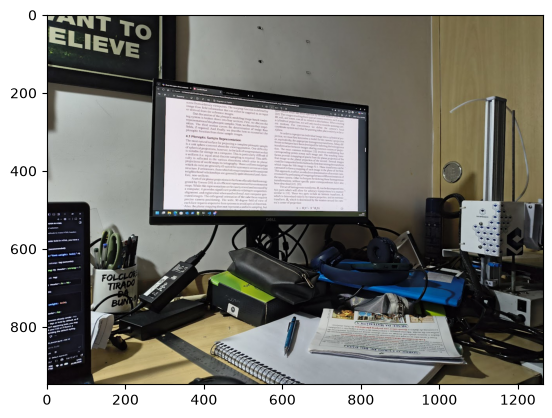

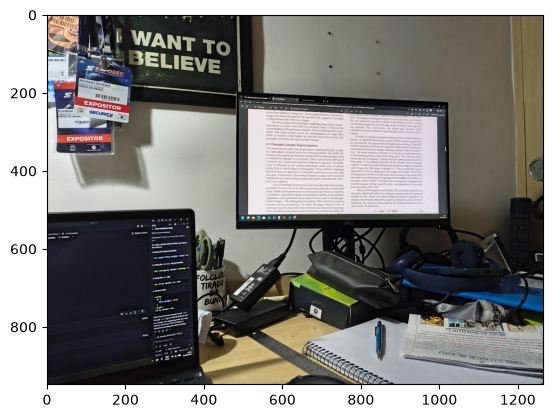

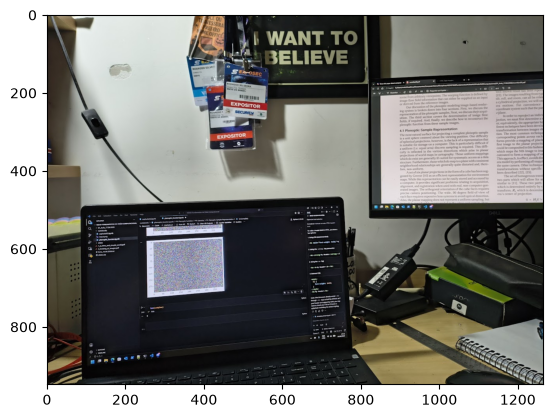

In [7]:
samples = [
    PlenopticSample((0, 0, 0), "imgs/panorama1.png"),
    PlenopticSample((1, 0, 0), "imgs/panorama2.png"),
    PlenopticSample((0, 1, 0), "imgs/panorama3.png"),
]

for sample in samples:
    plt.imshow(sample.image, cmap='gray', aspect='auto')
    plt.show()

#### Step 4: Query the plenoptic function

In [8]:
theta = 0.2   # look slightly right
h = 0.5       # middle height

# color = samples[0].sample_ray(theta, h)
for sample in samples:
    color = sample.sample_ray(theta, h)
    print("RGB:", color)


RGB: [173 165 176]
RGB: [239 238 236]
RGB: [10 10 10]


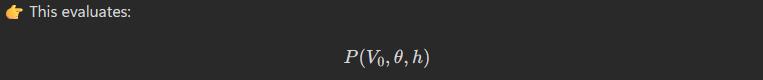

#### Step 5: Visual sanity check

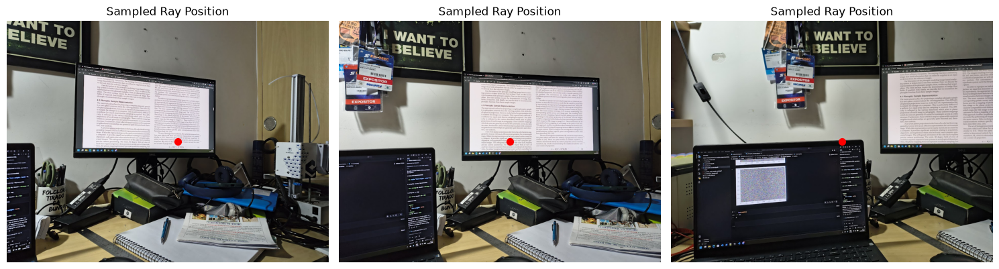

In [9]:
def visualize_samples(samples, theta, h):
    n = len(samples)

    plt.figure(figsize=(5 * n, 4))
    
    for i, sample in enumerate(samples):
        img = sample.image.copy()
        x = int((theta + np.pi) / (2 * np.pi) * sample.width)
        y = int(h * sample.height)
        plt.subplot(1, n, i + 1)
        plt.imshow(img)
        plt.scatter([x], [y], c='red', s=50)
        plt.title("Sampled Ray Position")
        plt.axis("off")

    plt.tight_layout()
    plt.show()



visualize_samples(samples, theta=0.2, h=0.5)

In [10]:
# def visualize_sample(sample, theta, h):
#     img = sample.image.copy()

#     x = int((theta + np.pi) / (2 * np.pi) * sample.width)
#     y = int(h * sample.height)

#     plt.imshow(img)
#     plt.scatter([x], [y], c='red', s=50)
#     plt.title("Sampled Ray Position")
#     plt.axis("off")
#     plt.show()

# for sample in samples:
#     visualize_sample(sample, theta=0.2, h=0.5)

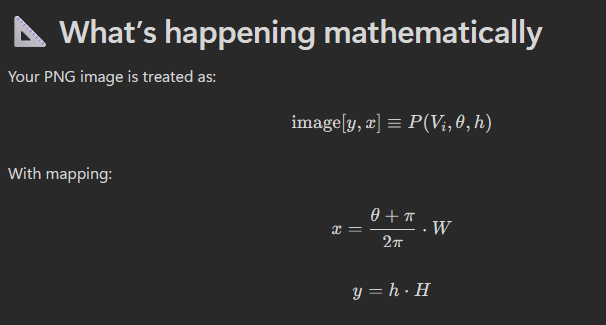

#### Step 6: Scene = multiple samples

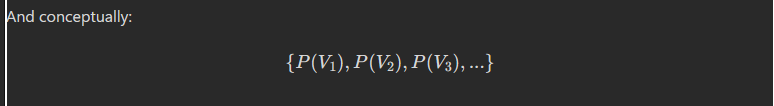

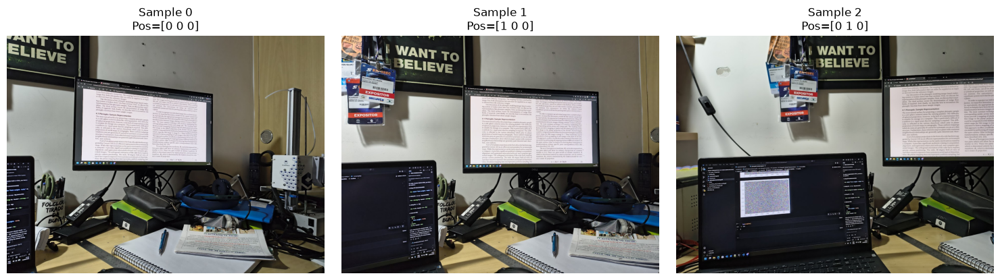

In [11]:

def show_scene_images(samples):
    n = len(samples)

    plt.figure(figsize=(5 * n, 4))

    for i, sample in enumerate(samples):
        plt.subplot(1, n, i + 1)
        plt.imshow(sample.image)
        plt.title(f"Sample {i}\nPos={sample.position}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()


show_scene_images(samples)

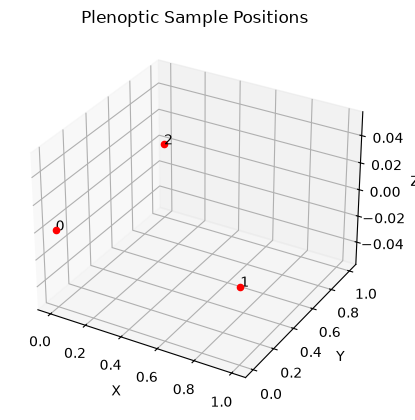

In [12]:
def plot_camera_positions(samples):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    for i, sample in enumerate(samples):
        x, y, z = sample.position
        ax.scatter(x, y, z, c='red')

        ax.text(x, y, z, f"{i}", color='black')

    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Z")
    ax.set_title("Plenoptic Sample Positions")

    plt.show()


plot_camera_positions(samples)

## 4.2 Acquiring Cylindrical Projections

Now let’s implement Section 4.2 – Acquiring Cylindrical Projections

How to convert normal perspective images into cylindrical panoramas

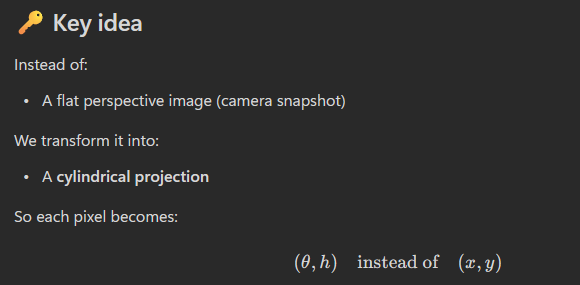

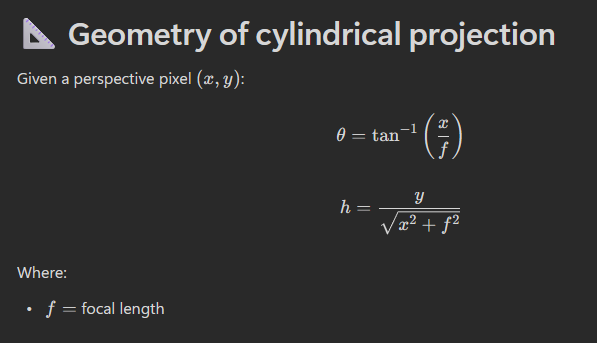



Convert perspective PNG images into cylindrical panoramas so they become proper samples of the plenoptic function.

#### Step 1: Load a perspective PNG

In [13]:
def load_image(path):
    img = Image.open(path).convert("RGB")
    return np.array(img)


#### Step 2: Cylindrical projection function

In [14]:
def cylindrical_projection(image, focal_length):
    h, w = image.shape[:2]

    # Output image (same size for simplicity)
    cyl = np.zeros_like(image)

    cx = w // 2
    cy = h // 2

    for y in range(h):
        for x in range(w):
            # Shift origin to center
            x_shift = x - cx
            y_shift = y - cy

            # Convert to cylindrical coordinates
            theta = np.arctan(x_shift / focal_length)
            h_ = y_shift / np.sqrt(x_shift**2 + focal_length**2)

            # Map back to image coordinates
            x_src = int(focal_length * np.tan(theta) + cx)
            y_src = int(h_ * np.sqrt(x_shift**2 + focal_length**2) + cy)

            if 0 <= x_src < w and 0 <= y_src < h:
                cyl[y, x] = image[y_src, x_src]

    return cyl

#### Step 3: Run the conversion

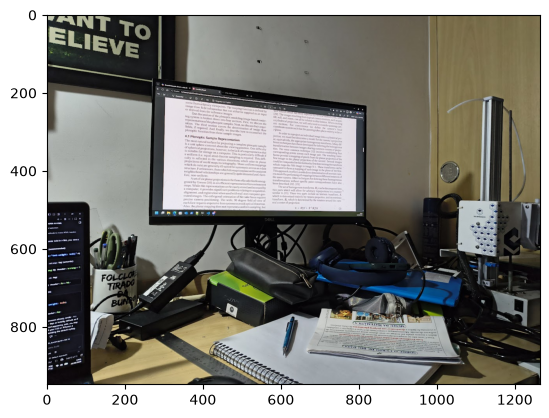

In [15]:

img = load_image("imgs/panorama1.png")

focal_length = 500  # try adjusting this
cyl_img = cylindrical_projection(img, focal_length)

plt.imshow(cyl_img)
plt.show()

#### Step 5: Integrate into 4.1 pipeline

Now modified PlenopticSample so it converts images automatically:

In [16]:
class PlenopticSample:
    def __init__(self, position, image_path, focal_length=500):
        self.position = np.array(position)

        img = load_image(image_path)

        # Convert to cylindrical representation
        self.image = cylindrical_projection(img, focal_length)

        self.height, self.width = self.image.shape[:2]

    def sample_ray(self, theta, h):
        x = int((theta + np.pi) / (2 * np.pi) * self.width)
        y = int(h * self.height)

        x = np.clip(x, 0, self.width - 1)
        y = np.clip(y, 0, self.height - 1)

        return self.image[y, x]

In [17]:
samples = [
    PlenopticSample((0, 0, 0), "imgs/panorama1.png"),
    PlenopticSample((1, 0, 0), "imgs/panorama2.png"),
    PlenopticSample((0, 1, 0), "imgs/panorama3.png"),
]

# for sample in samples:
#     plt.imshow(sample.image, cmap='gray', aspect='auto')
#     plt.show()

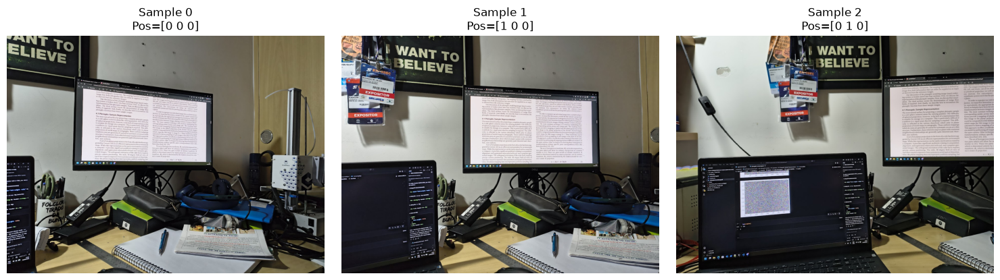

In [18]:
show_scene_images(samples)

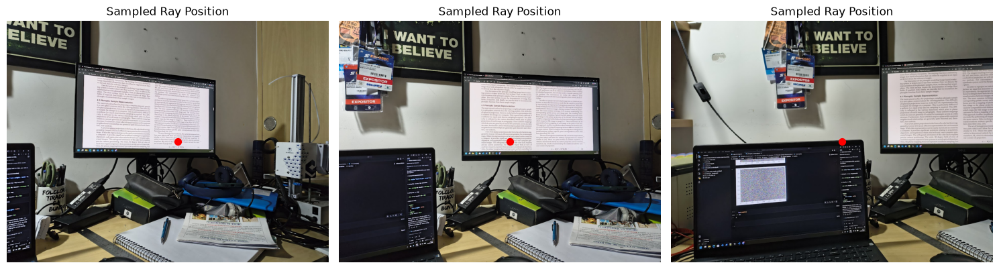

In [19]:
visualize_samples(samples, theta=0.2, h=0.5)

### Visualize the cylindrical surface

#### Step1 - Load your cylindrical image


In [20]:

img = np.array(Image.open("imgs/panorama1.png").convert("RGB"))
h, w = img.shape[:2]

#### Step 2 — Create cylindrical coordinates

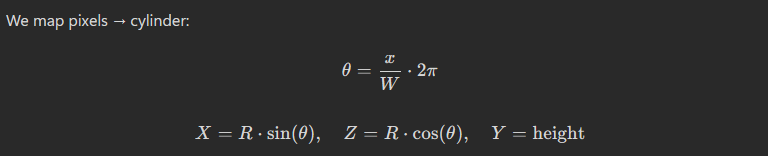

#### Step 3 — Build the 3D cylinder

In [21]:
theta = np.linspace(-np.pi, np.pi, w)
y = np.linspace(-1, 1, h)

theta_grid, y_grid = np.meshgrid(theta, y)

R = 1  # cylinder radius

X = R * np.sin(theta_grid)
Z = R * np.cos(theta_grid)
Y = y_grid

#### Step 4 — Map image onto cylinder

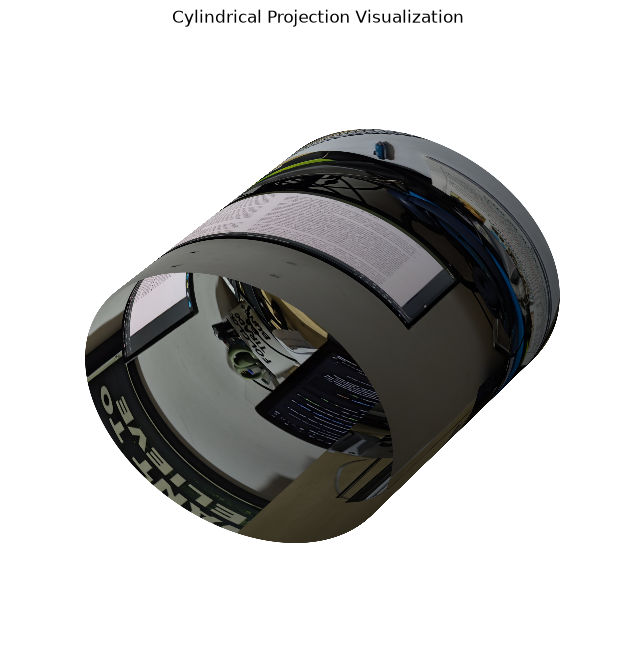

In [22]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Normalize image colors
img_normalized = img / 255.0

ax.plot_surface(
    X, Y, Z,
    facecolors=img_normalized,
    rstride=1,
    cstride=1
)

ax.set_title("Cylindrical Projection Visualization")
ax.set_axis_off()

plt.show()

#### Now with the samples

#### Step 1 — Cylinder mesh generator

In [23]:

def create_cylinder_mesh(image, radius=0.3, height_scale=1.0):
    h, w = image.shape[:2]

    theta = np.linspace(-np.pi, np.pi, w)
    y = np.linspace(-1, 1, h) * height_scale

    theta_grid, y_grid = np.meshgrid(theta, y)

    X = radius * np.sin(theta_grid)
    Z = radius * np.cos(theta_grid)
    Y = y_grid

    return X, Y, Z


#### Step 2 — Plot all samples as cylinders
#### Step 3 — Run it

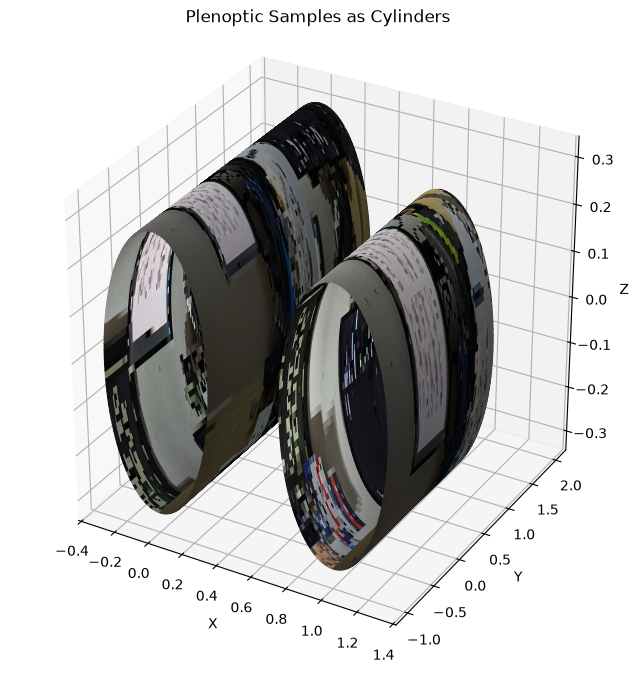

In [24]:
def plot_scene_cylinders(samples):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    for i, sample in enumerate(samples):
        img = sample.image / 255.0  # normalize colors

        X, Y, Z = create_cylinder_mesh(img)

        # Translate cylinder to its 3D position
        X = X + sample.position[0]
        Y = Y + sample.position[1]
        Z = Z + sample.position[2]

        # Plot cylinder surface
        ax.plot_surface(
            X, Y, Z,
            facecolors=img,
            rstride=10,
            cstride=10
        )

        # Mark camera position
        x, y, z = sample.position
        ax.scatter(x, y, z, c='red', s=50)
        ax.text(x, y, z, f"{i}", color='black')
        

    ax.set_title("Plenoptic Samples as Cylinders")

    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Z")

    ax.set_box_aspect([1,1,1])
    plt.show()



plot_scene_cylinders(samples)

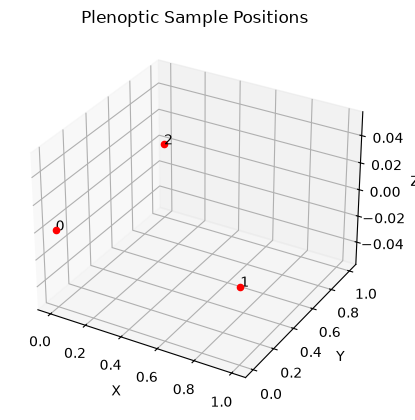

In [25]:
plot_camera_positions(samples)

## 4.3 Determining Image Flow Fields

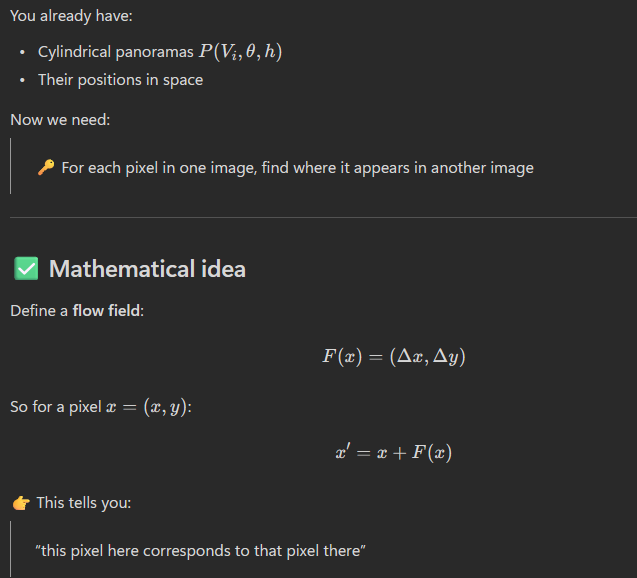

#### Step 1 - Install/import

```
import cv2
import numpy as np
import matplotlib.pyplot as plt
```

#### Step 2 — Prepare two samples

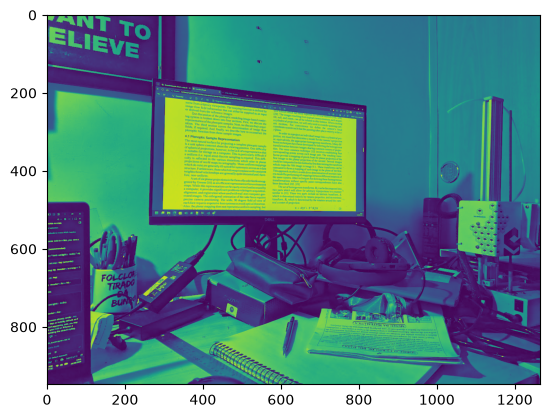

In [35]:

img1 = samples[0].image
img2 = samples[1].image

# Convert to grayscale (flow works better)
gray1 = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)

plt.imshow(gray1)
plt.show()

#### Step 3 — Compute dense optical flow

We use Farneback flow (fast and simple):

In [39]:
flow = cv2.calcOpticalFlowFarneback(
    gray1, gray2,
    None,
    pyr_scale=0.5,
    levels=3,
    winsize=15,
    iterations=3,
    poly_n=5,
    poly_sigma=1.2,
    flags=0
)

# This gives:
flow.shape #→ (H, W, 2)

# flow[..., 0] → horizontal shift (Δx)
# flow[..., 1] → vertical shift (Δy)

(948, 1264, 2)

#### Step 4 — Visualize the flow field

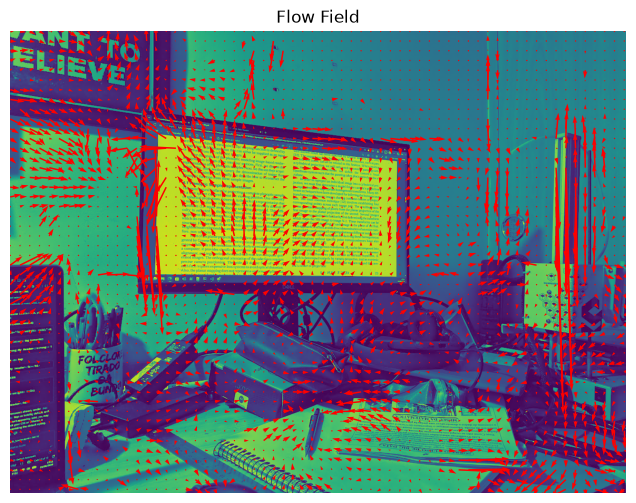

In [42]:
# Using Arrows
def plot_flow_arrows(image, flow, step=20):
    h, w = image.shape[:2]
    y, x = np.mgrid[0:h:step, 0:w:step]

    fx = flow[y, x, 0]
    fy = flow[y, x, 1]

    plt.figure(figsize=(8, 6))
    plt.imshow(image)
    plt.quiver(x, y, fx, fy, color='red')
    plt.title("Flow Field")
    plt.axis("off")
    plt.show()

plot_flow_arrows(gray1, flow)

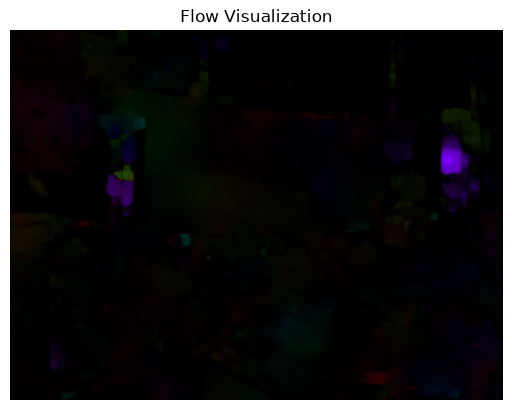

In [43]:
# Or using Color map
def flow_to_color(flow):
    mag, ang = cv2.cartToPolar(flow[...,0], flow[...,1])

    hsv = np.zeros((flow.shape[0], flow.shape[1], 3), dtype=np.uint8)
    hsv[..., 0] = ang * 180 / np.pi / 2
    hsv[..., 1] = 255
    hsv[..., 2] = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX)

    rgb = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
    return rgb


plt.imshow(flow_to_color(flow))
plt.title("Flow Visualization")
plt.axis("off")
plt.show()


#### Step 5 — Use flow to warp image

In [50]:
def warp_image(image, flow):
    h, w = flow.shape[:2]

    # Create grid
    x, y = np.meshgrid(np.arange(w), np.arange(h))

    # Apply flow
    map_x = (x + flow[..., 0]).astype(np.float32)
    map_y = (y + flow[..., 1]).astype(np.float32)

    # Warp image
    warped = cv2.remap(image, map_x, map_y, interpolation=cv2.INTER_LINEAR)

    return warped


# Apply warp
warped_img2 = warp_image(img2, -flow)

#### Show alignment

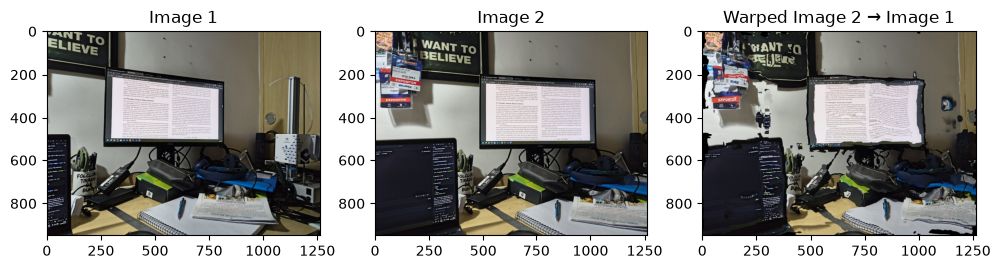

In [51]:
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(img1)
plt.title("Image 1")

plt.subplot(1, 3, 2)
plt.imshow(img2)
plt.title("Image 2")

plt.subplot(1, 3, 3)
plt.imshow(warped_img2)
plt.title("Warped Image 2 → Image 1")

plt.show()


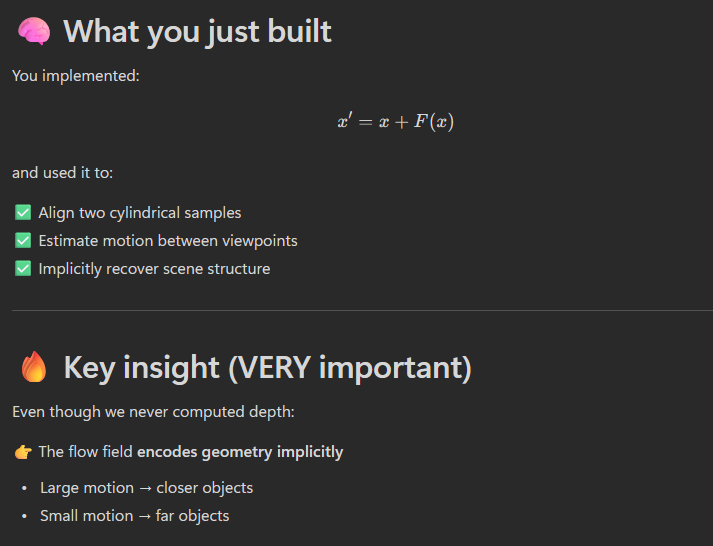

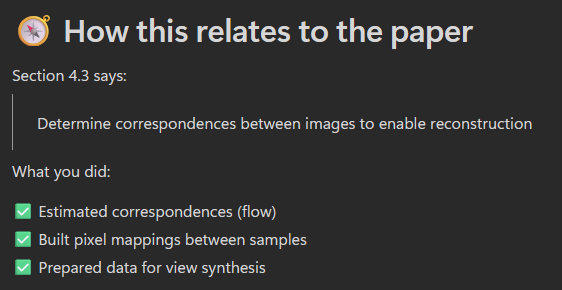

## 4.4 Plenoptic Function Reconstruction

🔥 Generate a new view by warping and blending your existing cylindrical samples.

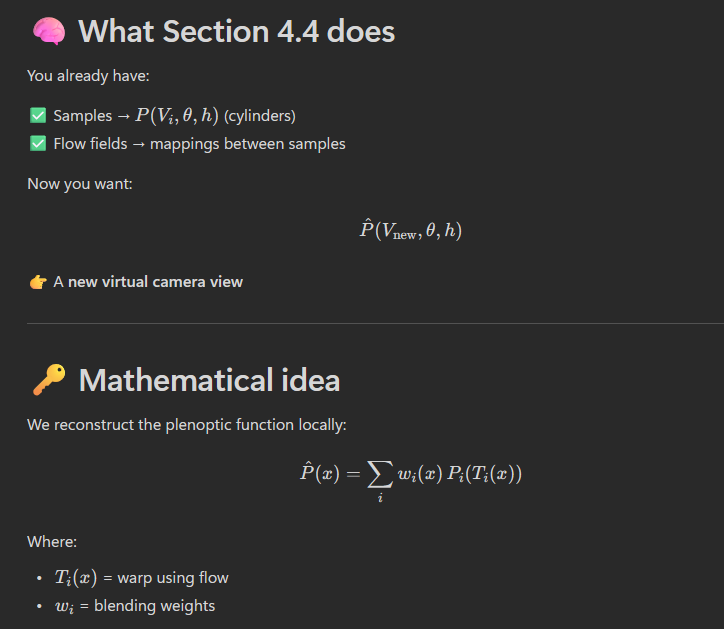


Pipeline:

* Choose new viewpoint between two samples
* Warp both images toward that viewpoint
* Blend them

#### Step 1 — Pick two samples

In [59]:

img1 = samples[0].image
img2 = samples[1].image

flow12 = cv2.calcOpticalFlowFarneback(
    cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY),
    cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY),
    None, 0.5, 3, 15, 3, 5, 1.2, 0
)


#### Step 2 — Warp function

In [60]:
def warp_with_flow(image, flow, t):
    """
    t = interpolation factor (0 → img1, 1 → img2)
    """
    h, w = flow.shape[:2]

    x, y = np.meshgrid(np.arange(w), np.arange(h))

    # Move partially along flow
    map_x = (x + t * flow[..., 0]).astype(np.float32)
    map_y = (y + t * flow[..., 1]).astype(np.float32)

    return cv2.remap(image, map_x, map_y, cv2.INTER_LINEAR)


#### Step 3 — Symmetric warping

We warp BOTH images toward the middle:

In [61]:
def reconstruct_view(img1, img2, flow12, alpha):
    """
    alpha = 0 → img1
    alpha = 1 → img2
    """
    # Warp img1 forward
    warp1 = warp_with_flow(img1, flow12, alpha)

    # Warp img2 backward
    warp2 = warp_with_flow(img2, -flow12, 1 - alpha)

    # Blend
    result = (1 - alpha) * warp1 + alpha * warp2
    return result.astype(np.uint8)

#### Step 4 — Generate new view

In [62]:
alpha = 0.5  # midpoint view
new_view = reconstruct_view(img1, img2, flow12, alpha)

#### Step 5 — Visualize

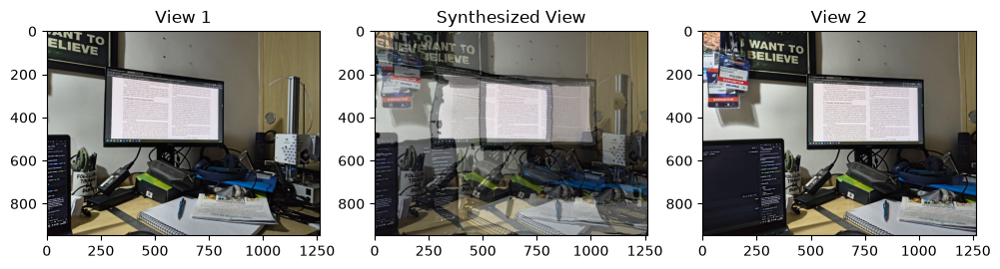

In [63]:
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(img1)
plt.title("View 1")

plt.subplot(1, 3, 2)
plt.imshow(new_view)
plt.title("Synthesized View")

plt.subplot(1, 3, 3)
plt.imshow(img2)
plt.title("View 2")

plt.show()

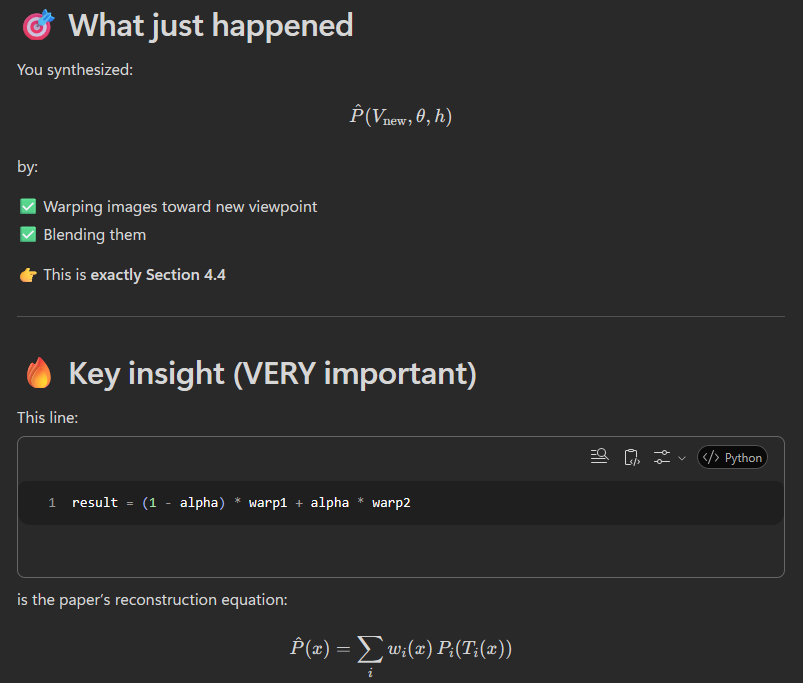

* You stand between two cameras
* Each image is slightly wrong
* You “pull” both images toward your viewpoint
* Then blend them

👉 That’s image-based rendering

#### Animate camera motion

This creates a smooth virtual camera movement

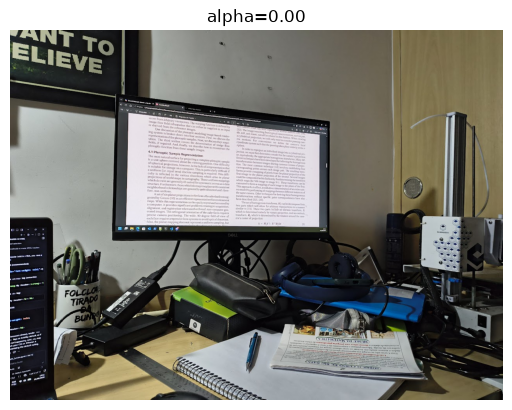

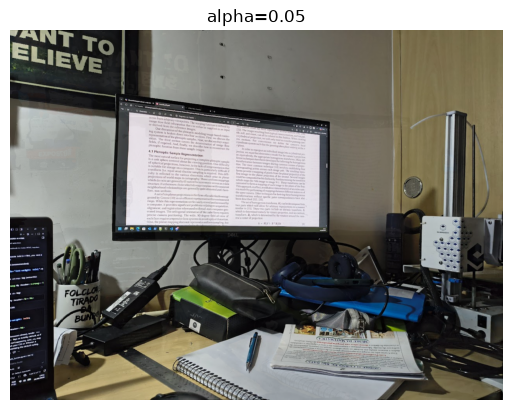

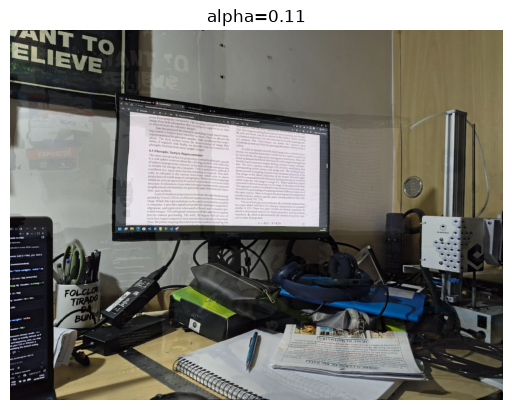

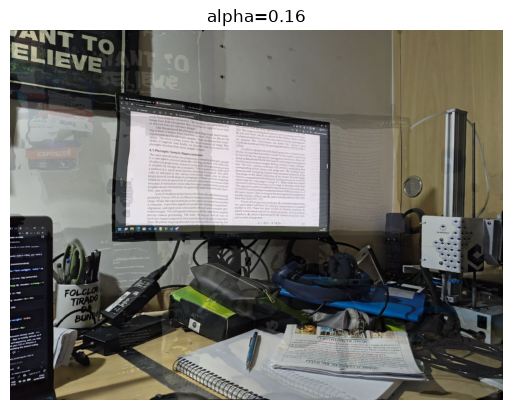

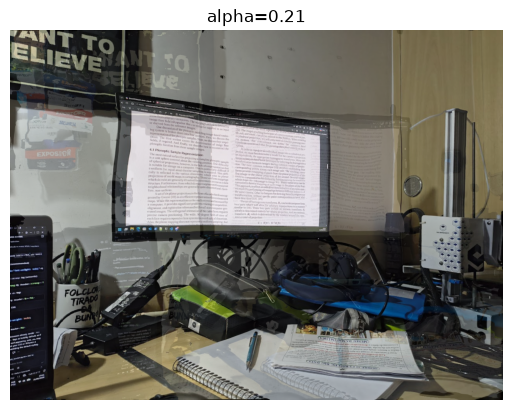

...

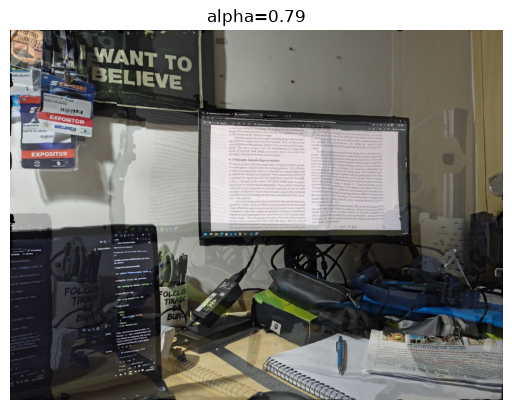

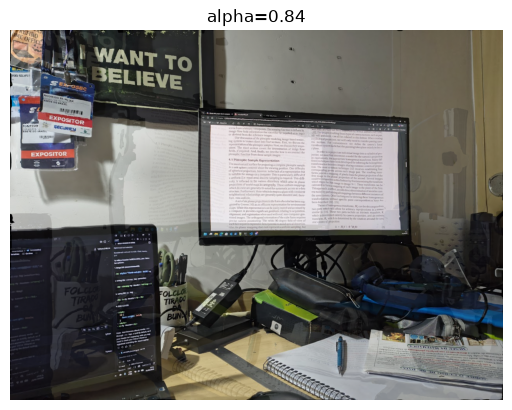

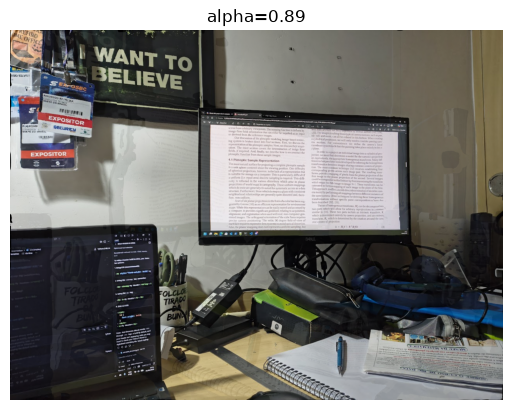

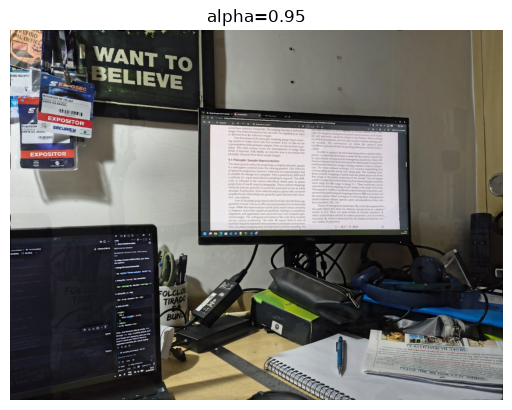

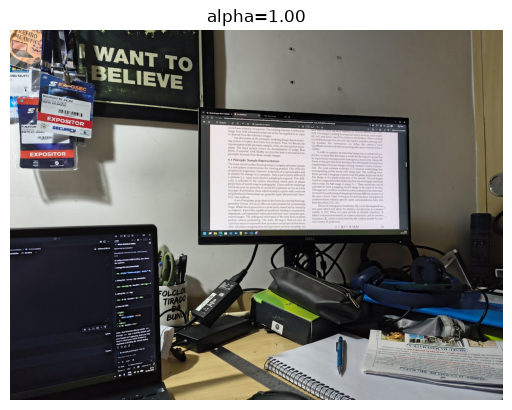

In [64]:
for alpha in np.linspace(0, 1, 20):
    view = reconstruct_view(img1, img2, flow12, alpha)

    plt.imshow(view)
    plt.title(f"alpha={alpha:.2f}")
    plt.axis("off")
    plt.pause(0.1)

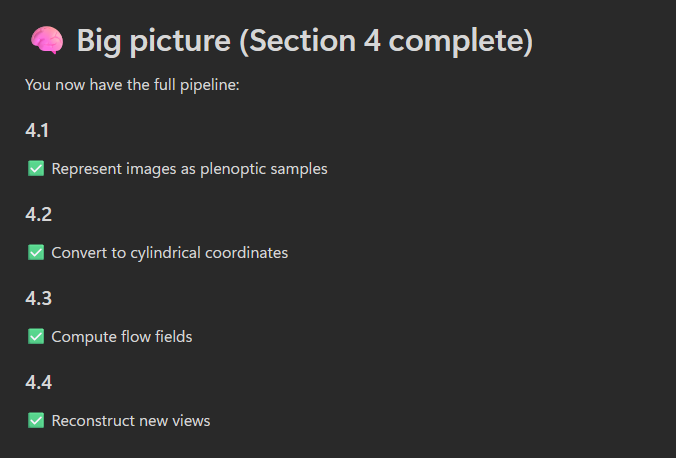